In [21]:
# imports
from pathlib import Path
import os 
import pandas as pd 
import numpy as np, scipy, matplotlib.pyplot as plt, sklearn,mir_eval,IPython.display as ipd
import librosa, librosa.display

# ML for MIR 

In [116]:
p = Path('/Users/olli/Desktop/ENGN4200') 
dataset = 'resources'
sub_dir = 'software'
p = p/dataset/sub_dir
p

WindowsPath('/Users/olli/Desktop/ENGN4200/resources/software')

In [117]:
# check music files in directory
files = list(p.glob('**/*.wav'))
files

[WindowsPath('/Users/olli/Desktop/ENGN4200/resources/software/eqt-major-sc.wav'),
 WindowsPath('/Users/olli/Desktop/ENGN4200/resources/software/II-V-I-major.wav'),
 WindowsPath('/Users/olli/Desktop/ENGN4200/resources/software/left_hand_major_251.wav'),
 WindowsPath('/Users/olli/Desktop/ENGN4200/resources/software/MAPS_ISOL_CH0.1_F_AkPnBcht.wav'),
 WindowsPath('/Users/olli/Desktop/ENGN4200/resources/software/MAPS_ISOL_CH0.3_F_AkPnBcht.wav'),
 WindowsPath('/Users/olli/Desktop/ENGN4200/resources/software/MAPS_MUS-bach_846_AkPnBcht.wav')]

In [118]:
# load the mixture audio file 
filename = files[2]
filename

WindowsPath('/Users/olli/Desktop/ENGN4200/resources/software/left_hand_major_251.wav')

In [119]:
# check to see it loaded
ipd.Audio(filename)

In [120]:
# load in all the files into dictionary for easy access and later use
sr = 44100
audio_data = {file.name : librosa.load(file,sr) for file in files}

In [149]:
x = audio_data['left_hand_major_251.wav'][0]

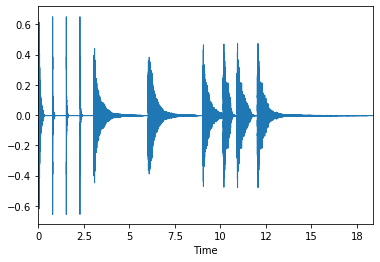

In [150]:
# display the sound wave 
librosa.display.waveplot(x, sr);

In [151]:
# remove percussive part 
x = x[int(2.5*sr):]
x

array([ 3.0517578e-05,  9.1552734e-05, -4.5776367e-05, ...,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00], dtype=float32)

### Onset frames 

In [416]:
# Classify onset frames, times and samples using spectral flux
onset_frames = librosa.onset.onset_detect(x, sr=sr, delta=0.04, wait=4)
onset_times = librosa.frames_to_time(onset_frames, sr=sr)
onset_samples = librosa.frames_to_samples(onset_frames)

In [417]:
# sonify the clicks 
x_with_beeps = mir_eval.sonify.clicks(onset_times, sr, length=len(x))
ipd.Audio(x + x_with_beeps, rate=sr)

## Feature Extraction 

In [418]:
# spectral entropy definition 
# https://raphaelvallat.com/entropy/build/html/generated/entropy.spectral_entropy.html

from scipy.signal import periodogram, welch
def spectral_entropy(x, sf, method='fft', nperseg=None, normalize=False):
    x = np.array(x)
    # Compute and normalize power spectrum
    if method == 'fft':
        _, psd = periodogram(x, sf)
    elif method == 'welch':
        _, psd = welch(x, sf, nperseg=nperseg)
    psd_norm = np.divide(psd, psd.sum())
    se = -np.multiply(psd_norm, np.log2(psd_norm)).sum()
    if normalize:
        se /= np.log2(psd_norm.size)
    return se

In [419]:
# define function to extract features
features_names = ['mean spectral bandwith','mean spectral centroid', 'energy','chroma maximum', 'spectral entropy']

def extract_features(x, sr):
    # spectral bandwith - mean of spectral bandwiths in frame
    sb = librosa.feature.spectral_bandwidth(x,sr=sr)
    sb = sb.mean()

    # spectral centroid - mean of spectral centroids in frame
    sc = librosa.feature.spectral_centroid(x,sr=sr)
    sc = sc.mean()
    
    # energy 
    energy = scipy.linalg.norm(x)
    
    # chroma maximum 
    chroma = librosa.feature.chroma_stft(x,sr=sr)
    chroma_max = np.argmax(np.array([note.sum() for note in chroma]))
    
    # entropy of the signal 
    entropy = spectral_entropy(x,sr)
    
    return [sc, sb, energy, chroma_max,entropy]

In [420]:
# extract features for each onset frame 
# frame size = 0.09 seconds

frame_sz = int(sr*0.090)
features = np.array([extract_features(x[i:i+frame_sz], fs) for i in onset_samples])
print(features.shape)

(6, 5)


## Feature Scaling

Scale the features (using the scale function) from -1 to 1.

In [421]:
min_max_scaler = sklearn.preprocessing.MinMaxScaler(feature_range=(-1, 1))

features_scaled = min_max_scaler.fit_transform(features)
print(features_scaled.shape)
print(features_scaled.min(axis=0))
print(features_scaled.max(axis=0))

(6, 5)
[-1. -1. -1. -1. -1.]
[1. 1. 1. 1. 1.]


In [422]:
features_names

['mean spectral bandwith',
 'mean spectral centroid',
 'energy',
 'chroma maximum',
 'spectral entropy']

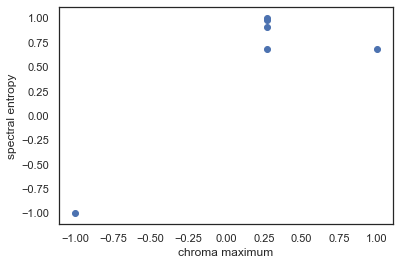

In [423]:
# plot
plt.scatter(features_scaled[:,3], features_scaled[:,4]);
plt.xlabel(features_names[3]);
plt.ylabel(features_names[4]);

## Classification of chords

In [424]:
# classify the sound events

model = sklearn.cluster.KMeans(n_clusters=3)
labels = model.fit_predict(features_scaled[:,3:5])
print(labels)

[1 0 2 2 2 2]


In [425]:
features_names

['mean spectral bandwith',
 'mean spectral centroid',
 'energy',
 'chroma maximum',
 'spectral entropy']

In [426]:
# put in dataframe to make it easy to graph
data = pd.DataFrame({'chroma maximum':features_scaled[:,3],
                    'spectral entropy':features_scaled[:,4],
                    'labels' : labels})
data.head()

,chroma maximum,spectral entropy,labels
0,-1.000000,-1.000000,1
1,1.000000,0.685158,0
2,0.272727,0.680581,2
3,0.272727,0.905037,2
4,0.272727,0.983930,2


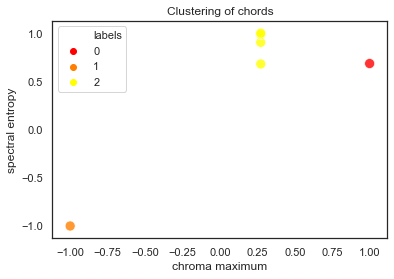

In [456]:
import seaborn as sns 
sns.set_style('white')
plt.title('Clustering of chords')
sns.scatterplot(data=data, x='chroma maximum',y='spectral entropy',
                hue='labels', palette='autumn',s=100,alpha=0.8);

Class 0 - corresponds to G7

In [432]:
x_with_beeps = mir_eval.sonify.clicks(onset_times[labels==0], sr, length=len(x))
ipd.Audio(x + x_with_beeps, rate=sr)

Class 1 - corresponds to the minor chord Dm7

In [429]:
x_with_beeps = mir_eval.sonify.clicks(onset_times[labels==1], sr, length=len(x))
ipd.Audio(x + x_with_beeps, rate=sr)

Class 2 - corresponds to the dominant chord G7

In [430]:
x_with_beeps = mir_eval.sonify.clicks(onset_times[labels==2], sr, length=len(x))
ipd.Audio(x + x_with_beeps, rate=sr)

## Hierachical Clustering of chords

In [344]:
features_names

['mean spectral bandwith',
 'mean spectral centroid',
 'energy',
 'chroma maximum',
 'spectral entropy']

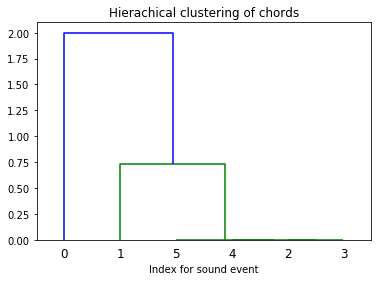

In [363]:
# Calculate the linkage: mergings
# Perform the necessary imports
from scipy.cluster.hierarchy import linkage, dendrogram

# do a hierachical clustering based on chroma maximum
mergings = linkage(features_scaled[:,3:4],method='complete')

# Plot the dendrogram, using varieties as labels
dendrogram(mergings)
plt.title('Hierachical clustering of chords')
plt.xlabel('Index for sound event')
plt.show()